<a href="https://colab.research.google.com/github/RedSnyper/AmenityDetection/blob/main/ModelBuild.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
#COCO
!wget http://images.cocodataset.org/annotations/annotations_trainval2017.zip
!unzip annotations_trainval2017.zip
!rm annotations_trainval2017.zip
!wget http://images.cocodataset.org/annotations/image_info_test2017.zip
!unzip image_info_test2017.zip


#OPENIMAGES
!wget -O train-annotations-bbox.csv https://storage.googleapis.com/openimages/v6/oidv6-train-annotations-bbox.csv 

!wget -O val-annotations-bbox.csv https://storage.googleapis.com/openimages/v5/validation-annotations-bbox.csv

!wget https://storage.googleapis.com/openimages/v5/test-annotations-bbox.csv

!wget https://storage.googleapis.com/openimages/v5/class-descriptions-boxable.csv

!wget -O train-images-with-rotation.csv https://storage.googleapis.com/openimages/2018_04/train/train-images-boxable-with-rotation.csv

!wget -O val-images-with-rotation.csv https://storage.googleapis.com/openimages/2018_04/validation/validation-images-with-rotation.csv

!wget https://storage.googleapis.com/openimages/2018_04/test/test-images-with-rotation.csv

--2022-07-31 16:48:58--  http://images.cocodataset.org/annotations/annotations_trainval2017.zip
Resolving images.cocodataset.org (images.cocodataset.org)... 52.217.205.193
Connecting to images.cocodataset.org (images.cocodataset.org)|52.217.205.193|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 252907541 (241M) [application/zip]
Saving to: ‘annotations_trainval2017.zip’

annotations_trainva 100%[===================>] 241.19M  86.0MB/s    in 2.8s    

2022-07-31 16:49:01 (86.0 MB/s) - ‘annotations_trainval2017.zip’ saved [252907541/252907541]

Archive:  annotations_trainval2017.zip
  inflating: annotations/instances_train2017.json  
  inflating: annotations/instances_val2017.json  
  inflating: annotations/captions_train2017.json  
  inflating: annotations/captions_val2017.json  
  inflating: annotations/person_keypoints_train2017.json  
  inflating: annotations/person_keypoints_val2017.json  
--2022-07-31 16:49:10--  http://images.cocodataset.org/annotations/i

In [2]:
import os
import cv2
import csv
import json
import tqdm
import random
import requests
import imagesize
import urllib.request
import concurrent.futures
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from tqdm import notebook
from time import perf_counter
from abc import ABC, abstractmethod
from matplotlib.pyplot import figure
from collections import Counter
from pathlib import Path
count = 0 #for annotation ids

In [3]:
class Dataset(ABC):

  @abstractmethod
  def download_dataset(self): #type hint for returning csv or json file? 
    pass

  @abstractmethod
  def load_dataset(self):
    pass
  
  @abstractmethod
  def keep_specific_annotations(self):
    pass

  @abstractmethod
  def visualize_dataset(self):
    pass

  @abstractmethod
  def download_images_thread(self):
    pass

  @abstractmethod
  def to_coco(self):
    pass

  @classmethod
  def download_images(cls,img_detail:tuple):
      #TODO keep record of all failed images and remove the info from datasets
      img_url, filename = img_detail[0], img_detail[1]
      res = requests.get(img_url)
      if res.status_code == 200:
        filepath = Path(filename)
        filepath.parent.mkdir(parents=True, exist_ok=True)
        with filepath.open("wb") as f:
            f.write(res.content)

  @staticmethod           #static not class as draw_plot is used elsewhere too. Would be better if this is out of the class into its own function
  def draw_plot(label: str,annotation_counts: dict, name:str):
    print("OCCURANCES")
    for key,value in list(annotation_counts.items()):
      if value==0:
        del annotation_counts[key]
        continue
      print(f'{key}------------------>{value}')
    plt.figure(figsize=(30,8))
    plt.title(f'{name.upper()}: {label} dataset', fontdict = dict(fontsize=30))
    plt.xlabel("amenities",fontdict=dict(fontsize=20))
    plt.ylabel("count",fontdict=dict(fontsize=20))
    plt.bar(*zip(*annotation_counts.items()))
    for i, v in enumerate(annotation_counts.values()):
      plt.text(i,v,v,fontdict=dict(fontsize=15), ha='center')
    plt.show()


  @staticmethod
  def place_json_file(label:list, dataset: dict, name: str, root = "data"):
    json_folder = os.path.join(root,label)
    json_file = os.path.join(json_folder, f'{label}_{name}.json')
    filepath = Path(json_file)
    filepath.parent.mkdir(parents=True, exist_ok=True)
    with filepath.open("w") as f:
        print(f'\nmaking {label} json file in {f.name}')
        json.dump(dataset, f)

In [4]:
class COCODataset(Dataset):
    def __init__(self, labels: list, amenities_mapping: dict, root: str = "data" ):
      self.root = root
      self.dataset = dict()
      self.labels = labels
      self.amenities_mapping = amenities_mapping     #ground truth of amenities and its id
      self.amenities: list = amenities_mapping.keys()
      for label in labels:
        self.dataset[label] = dict()

    #TODO use subprocess python module instead of linux command
    def download_dataset(self) -> None:
        pass

    def load_dataset(self):
      for label in self.labels:
        filename = f'annotations/instances_{label}2017.json' 
        with open(filename) as f:
          print(f'Loading {filename} into memory')
          start = perf_counter()
          self.dataset[label] = json.load(f)
          end = perf_counter()
          print(f"Loaded the file in {end-start:.2f} seconds")

    def _generate_mapping(self):
        category_dict = {cats['name']:cats['id'] 
                        for cats in self.dataset["val"]["categories"]} #categories are same for train, val, test
        req_keys = [category_dict[item] for item in 
                    set(self.amenities_mapping.keys()).intersection(category_dict.keys())]
        category_dict = {key:value for value, key in category_dict.items()}
        return (req_keys, category_dict) 


    def keep_specific_annotations(self) -> dict:
        global count
        req_keys, category_dict = self._generate_mapping()
        for label in self.labels:
          print(f"processing {label} dataset....\n")
          categories = list()
          annotations = list()
          images = list()
          print(f'Categories before: {len(self.dataset[label]["categories"])}')    
          print(f'Annotations before: {len(self.dataset[label]["annotations"])}')  
          print(f'Images before: {len(self.dataset[label]["images"])}')  


          for cats in self.dataset[label]['categories']:
            if cats['name'] in self.amenities_mapping.keys():
              cats['id'] = self.amenities_mapping[cats['name']]
              del cats['supercategory']
              categories.append(cats)

          for anns in self.dataset[label]['annotations']:
            if anns['category_id'] in req_keys:
              del anns['segmentation'] #for object detection, seg not necessary.Saving memory
              anns['bbox_mode'] = 1
              anns['category_id'] = self.amenities_mapping[category_dict[anns['category_id']]]
              anns['image_id'] = str(anns['image_id'])
              anns['id'] = count
              count += 1
              annotations.append(anns)
          
          img_ids = [data['image_id'] for data in annotations]

          for imgs in self.dataset[label]["images"]:
            if str(imgs['id']) in img_ids:
              del imgs['license']
              del imgs['date_captured']
              del imgs['flickr_url']
              imgs['id'] = str(imgs['id'])
              images.append(imgs)

          del self.dataset[label]['annotations'] #removes old annotations. Releases big chunck of memory.
          del self.dataset[label]['categories']
          del self.dataset[label]['images']
          del self.dataset[label]['info']
          del self.dataset[label]['licenses']

          self.dataset[label]['annotations'] = annotations
          self.dataset[label]['categories'] = categories
          self.dataset[label]['images'] = images

          print(f'Categories after keeping only required: {len(self.dataset[label]["categories"])}')    
          print(f'Annotations after keeping only required: {len(self.dataset[label]["annotations"])}')    
          print(f'Images after keeping only required: {len(self.dataset[label]["images"])}\n')

    def visualize_dataset(self):
      from collections import Counter
      for label in self.labels:
        counter = Counter()
        for data in self.dataset[label]['annotations']:
          counter.update([data["category_id"]])
        for k, v in self.amenities_mapping.items():
          counter[k] = counter[v]
          del counter[v]
        Dataset.draw_plot(label, counter, "coco")

    def download_images_thread(self):
      for label in self.labels:
        im_folder = os.path.join(self.root, label)
        images = self.dataset[label]['images']
        with tqdm.tqdm(total=len(images), desc=f'downloading images for {label}') as pbar:
          with concurrent.futures.ThreadPoolExecutor(len(images)) as executor: #1000 or len(images)? 
            for imgs in images:
                im_path = os.path.join(im_folder, imgs['file_name'])
                if not os.path.exists(im_path):
                  executor.submit(super().download_images, (imgs['coco_url'],im_path))
                del imgs['coco_url']
                pbar.update(1)

    def to_coco(self):
      pass

    def place_json_file(self):
      for label in self.labels:
        Dataset.place_json_file(label=label, dataset=self.dataset[label], name="coco", root=self.root)

In [5]:
class OpenImages(Dataset):
    def __init__(self, labels: list, amenities_mapping: dict, root: str = "data" ):
      self.root = root
      self.dataset = dict()
      self.imgset = dict()
      self.labels = labels
      self.amenities_mapping = amenities_mapping 
      self.amenities:list = amenities_mapping.keys()
      for label in labels:
        self.dataset[label] = dict()
        self.imgset[label] = dict()
      self.amenities_labels = dict()

    #TODO use subprocess python module instead of linux command
    def download_dataset(self) -> None:
        pass


    def load_dataset(self):
      for label in self.labels:
        #load bbox csv files
        print(f'Loading {label} annotations csv into memory...')
        self.dataset[label] = pd.read_csv(f'{label}-annotations-bbox.csv')
        print("done")
        #load image csv files
        print(f'Loading {label} image csv into memory...')
        self.imgset[label] = pd.read_csv(f'{label}-images-with-rotation.csv')
        print("done\n")

      #load label dataset
      print("loading class-label csv file")
      with open("class-descriptions-boxable.csv") as file:
        reader = csv.reader(file)
        for row in reader:
          if row[0] == "/m/03wvsk":
            row[1] = "hair drier"
          if row[0] =='/m/011k07':
            row[1] = 'microwave'
          if row[1].lower() in self.amenities:
            self.amenities_labels.update({row[0]: row[1].lower()})

    def keep_specific_annotations(self):
      for label in self.labels:
        print(f'Annotations info in {label} before: {len(self.dataset[label])}')
        self.dataset[label] = self.dataset[label].loc[
                  self.dataset[label]['LabelName'].isin(self.amenities_labels.keys())]
        assert len(self.dataset[label]) > 0, f"Annotation for some amenity does not exist in {label} dataset"
        
        print(f'Annotations info in {label} after: {len(self.dataset[label])} \n')

        print(f'Images info in {label} before: {len(self.imgset[label])}')
        img_ids = self.dataset[label]['ImageID']
        self.imgset[label] = self.imgset[label].loc[self.imgset[label]["ImageID"].isin(img_ids)]
        print(f'Images info in {label} after: {len(self.imgset[label])} \n')

    def visualize_dataset(self):
      from collections import Counter
      for label in self.labels:
        c = Counter()
        c.update(self.dataset[label]["LabelName"])
        images_count = dict()
        for key, value in c.items():
          images_count[self.amenities_labels[key]] = value
        super().draw_plot(label, images_count, "open images")


    def download_images_thread(self):
      for label in self.labels:
        im_folder = os.path.join(self.root, label)
        images = self.imgset[label]
        with tqdm.tqdm(total=len(images), desc=f'downloading images for {label}') as pbar:
          with concurrent.futures.ThreadPoolExecutor(len(images)) as executor:
            for imgs in images.to_numpy():
                im_path = os.path.join(im_folder, imgs[0])
                im_path = f'{im_path}.jpg'
                if not os.path.exists(im_path):
                  executor.submit(super().download_images, (imgs[2],im_path))
                pbar.update(1)


    def to_coco(self):
      global count
      for label in self.labels: 
        records = []
        images = []
        annotations = []
        categories = []

        for key, value in self.amenities_labels.items():
          category = {"id" : self.amenities_mapping[self.amenities_labels[key]], 
                      "name" :value}
          categories.append(category)
      
        for img_file in tqdm.notebook.tqdm(Path(f'{self.root}/{label}').glob("*.jpg"), 
                                           desc = f'Converting to COCO format for {label} datset'):
          imgs = {}
          anns = {}
          file_name = img_file.name
          id = file_name.split('.')[0]
          if id.isnumeric():  #the numeric are of only coco which are already in dataset
            continue
          width,height = imagesize.get(img_file) #using imagesize instead of cv2. Insane speed up
          imgs["file_name"] = file_name
          imgs["id"] = id
          imgs["width"] = width
          imgs["height"] = height
          images.append(imgs)
          ##################################################################
          datas = self.dataset[label][self.dataset[label]["ImageID"] == id] #many entries for same image id can exist
          # count += 1
          for data in datas.to_numpy():
            category_id = self.amenities_mapping[self.amenities_labels[data[2]]]
            xmin= data[4] * width
            xmax = data[5] * width
            ymin = data[6] * height
            ymax = data[7] * height
            dx = xmax - xmin
            dy = ymax - ymin
            anns["image_id"] = id
            anns["bbox"] = [round(a, 2) for a in [xmin , ymin, dx, dy]] #XYWH format
            anns["bbox_mode"] = 1
            anns["category_id"] = category_id
            anns['id'] = count
            anns['area'] = dx * dy
            anns['iscrowd'] = 0 #remove this later
            count += 1
            annotations.append(anns)
            anns = {} 
        self.dataset[label] = dict() #removing the panads dataframe entirely
        self.dataset[label]["images"] = images
        self.dataset[label]['annotations'] = annotations
        self.dataset[label]['categories'] = categories  

    def place_json_file(self):
      for label in self.labels:
        super().place_json_file(label=label, dataset=self.dataset[label], name="oi", root=self.root)


In [6]:
class DatasetFactory():
    def __init__(self,source:str,labels:list,root:str,amenities:list ):
      self.amenities_mapping = {value:key for key, value in enumerate(sorted(amenities))}
      self.labels = labels
      self.root = root
      if source == "coco":
        if "test" in self.labels: 
          self.labels.remove('test')
            #COCO dataset test label is just for predicting images. Has no annotations, 
            #no label,so is useless for our use case.
        self._dataset = COCODataset(self.labels, self.amenities_mapping, self.root)
      elif source == "oi":
        self._dataset = OpenImages(self.labels, self.amenities_mapping, self.root)
      else:
        raise NotImplementedError(f"dataset source: {source} has not been implemented")

    @property
    def dataset(self):
      return self._dataset.dataset 
                #_dataset = property of DatasetFactory #dataset = property of COCODataset/OpenImages

    @property
    def factory(self):
      return self._dataset #returns the factory(source)


    def generate(self):
      """
      Generates the dataset in one go. 
      """
      self._dataset.load_dataset()
      self._dataset.keep_specific_annotations()
      self._dataset.visualize_dataset()
      self._dataset.download_images_thread()
      self._dataset.to_coco()
      self._dataset.place_json_file()

    def __add__(self, other):
      if isinstance(other, DatasetFactory):
        for ds in self.dataset.keys():
          merged_dataset[ds] = {}
          if ds == "test":  #coco test dataset is not included
            continue
          for keys in self.dataset[ds].keys():
            data = self.dataset[ds][keys] + other.dataset[ds][keys]
            if keys == "categories": #this is the only thing that is repeated
              data = [dict(t) for t in {tuple(d.items()) for d in data}]
            merged_dataset[ds][f'{keys}'] = data

            #one way to save memory is to extend the existing list (coco or oi) with its respective list from another dataset(coco or oi)
          
        return merged_dataset
      else:
        raise TypeError("invalid type")  

    @staticmethod
    def visualise_dataset(dataset, amenities,plot_title):
        amenities_mapping = {value:key for key, value in enumerate(sorted(amenities))}
        from collections import Counter
        for label in dataset.keys():
          counter = Counter()
          for data in dataset[label]['annotations']:
            counter.update([data["category_id"]])
          for k, v in amenities_mapping.items():
            counter[k] = counter[v]
            del counter[v]
          Dataset.draw_plot(label, counter, plot_title)

    @staticmethod
    def limit_annotation_count(dataset, limit = 1000):
      from collections import Counter
      from random import shuffle
      for label in dataset.keys():
        annotations = []
        counter = Counter()
        shuffle(dataset[label]['annotations'])
        for data in dataset[label]['annotations']:
          if counter.get(data['category_id'],0) >= limit:
            continue
          counter.update([data["category_id"]])
          annotations.append(data)
        del dataset[label]["annotations"]
        dataset[label]["annotations"] = annotations
        #TODO remove images having no annotations
      DatasetFactory.visualise_dataset(dataset, amenities, "Merged(Limited)")

    @staticmethod
    def remove_unused_images(dataset):
      for label in dataset.keys():
        images = []
        print(label)
        print(f'Images before: {len(dataset[label]["images"])}')  
        img_ids = [data['image_id'] for data in dataset[label]["annotations"]]
        for imgs in dataset[label]["images"]:
          if imgs['id'] in img_ids:
            images.append(imgs)
          else:
            if len(str(imgs['id'])) <= 7:    # hack to know this is coco id, img never exceeds 6 digits (9*10*10*10*10*10=900k, coco has 330k)
                                             # len(7) just for safeguard.
              zeros = '0' * (12-len(str(imgs['id']))) #coco specific
              filename = f"{zeros}{imgs['id']}.jpg"
            else:
              filename = f"{imgs['id']}.jpg"
            file_path = os.path.join("data",label, filename)  
            if os.path.exists(file_path):
              os.remove(file_path)
        del dataset[label]["images"]
        dataset[label]["images"] = images
        print(f'Images after: {len(dataset[label]["images"])}')  

    @staticmethod
    def place_json_file(dataset, root):
      for label in dataset.keys():
        json_file = os.path.join(root, label, f'{label}.json')
        filepath = Path(json_file)
        filepath.parent.mkdir(parents=True, exist_ok=True)
        with filepath.open("w") as f:
            print(f'Making {label} json file in {f.name}')
            json.dump(dataset[label], f)



Loading annotations/instances_train2017.json into memory
Loaded the file in 16.47 seconds
Loading annotations/instances_val2017.json into memory
Loaded the file in 0.43 seconds
processing train dataset....

Categories before: 80
Annotations before: 860001
Images before: 118287
Categories after keeping only required: 3
Annotations after keeping only required: 7644
Images after keeping only required: 4639

processing val dataset....

Categories before: 80
Annotations before: 36781
Images before: 5000
Categories after keeping only required: 3
Annotations after keeping only required: 324
Images after keeping only required: 191

OCCURANCES
microwave------------------>1673
oven------------------>3334
refrigerator------------------>2637


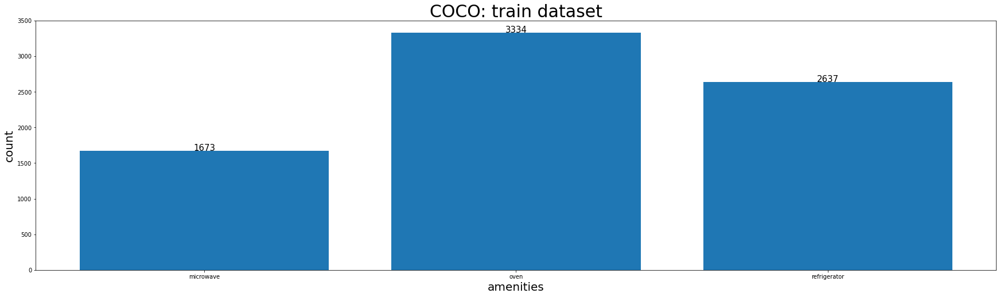

OCCURANCES
microwave------------------>55
oven------------------>143
refrigerator------------------>126


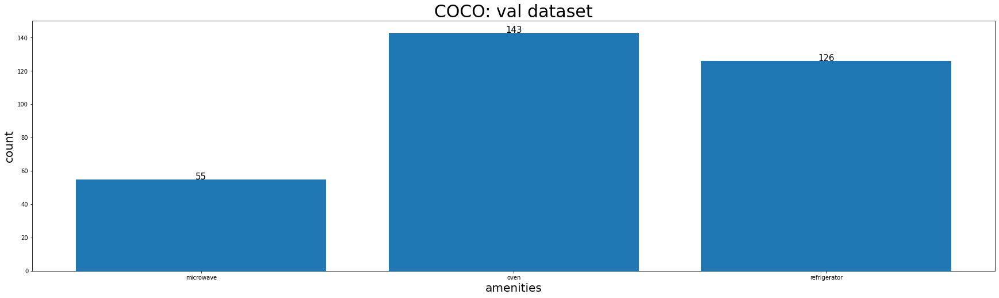

downloading images for val: 100%|██████████| 191/191 [00:01<00:00, 143.20it/s]



making train json file in data/train/train_coco.json

making val json file in data/val/val_coco.json
Loading train annotations csv into memory...
done
Loading train image csv into memory...
done

Loading val annotations csv into memory...
done
Loading val image csv into memory...
done

loading class-label csv file
Annotations info in train before: 14610229
Annotations info in train after: 3227 

Images info in train before: 1743042
Images info in train after: 2325 

Annotations info in val before: 303980
Annotations info in val after: 119 

Images info in val before: 41620
Images info in val after: 94 

OCCURANCES
refrigerator------------------>592
microwave------------------>1998
oven------------------>637


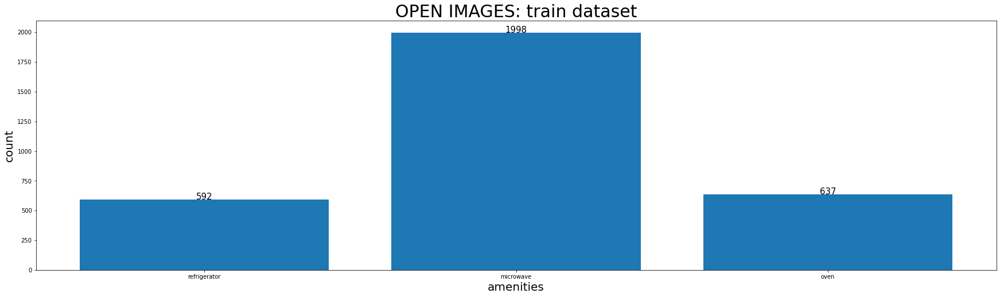

OCCURANCES
microwave------------------>57
refrigerator------------------>26
oven------------------>36


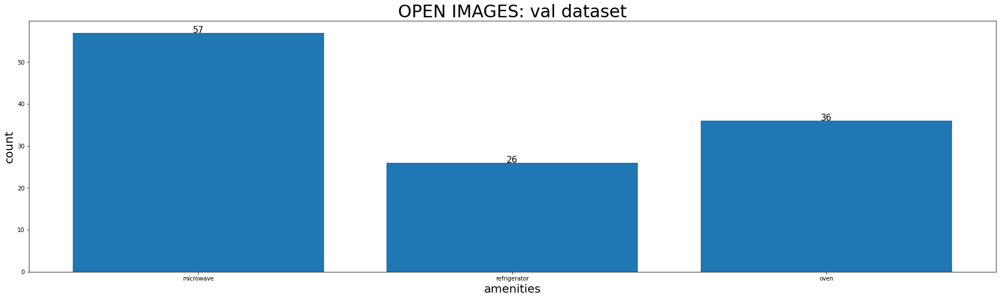

downloading images for val: 100%|██████████| 94/94 [00:02<00:00, 42.55it/s]


Converting to COCO format for train datset: 0it [00:00, ?it/s]

Converting to COCO format for val datset: 0it [00:00, ?it/s]


making train json file in data/train/train_oi.json

making val json file in data/val/val_oi.json
For train
Before Merging
COCO: Images = 4639, COCO: Annotations 7644
Open Images: Images = 2134, Open Images: Annotations 2977
After Merging
Merged: Images = 6773, Merged: Annotations 10621

For val
Before Merging
COCO: Images = 191, COCO: Annotations 324
Open Images: Images = 84, Open Images: Annotations 108
After Merging
Merged: Images = 275, Merged: Annotations 432

OCCURANCES
microwave------------------>3523
oven------------------>3912
refrigerator------------------>3186


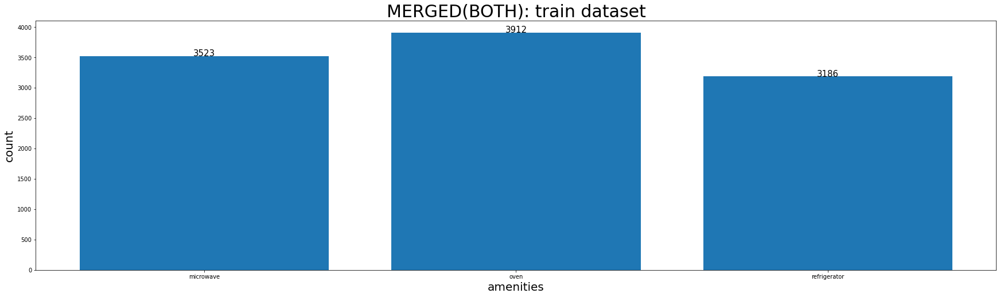

OCCURANCES
microwave------------------>108
oven------------------>175
refrigerator------------------>149


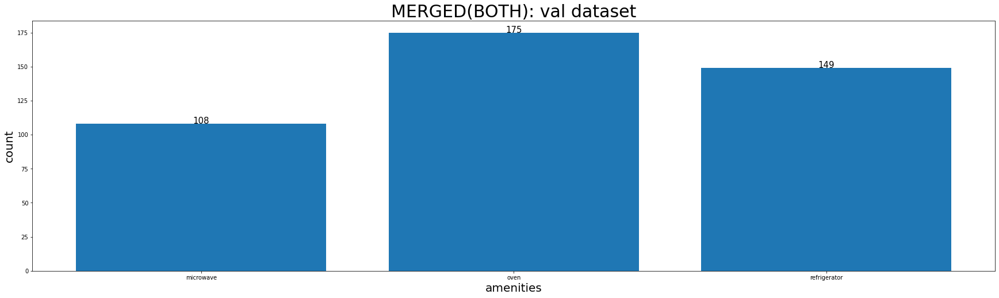

Making train json file in data/train/train.json
Making val json file in data/val/val.json
Making train json file in merged_data/train/train.json
Making val json file in merged_data/val/val.json


In [7]:
if __name__ == "__main__": 
  amenities = ['Toilet', 'Bed', 'Biliard_table', 'Sink', 'Fountain', 
             'Oven', 'Television', 'Microwave oven', 'Gas stove', 
             'Refrigerator', 'Kitchen & dining room table', 'Washing machine', 'Bathtub', 
             'Stairs', 'Fireplace', 'Pillow', 'Mirror', 'Shower', 'Couch', 'Countertop', 
             'Coffeemaker', 'Dishwasher', 'Sofa bed', 'Towel', 'Porch', 'Wine rack',
             'Jacuzzi', "Clock", "Bidet", "Casette deck", "Cabinetry", "Desk", "Wardrobe",
             "Mechanical Fan", "Treadmill", "Bookcase", "Kitchenware", "Houseplant", 
             "Ceiling fan", "Kettle", "Hair dryer", "Alarm clock", "Table", 
             "Frying pan", "Bathroom cabinet", "Training bench",
             "Telephone", "Swimming pool", "Hand dryer", "Closet", "Lamp",
             "Drawer", "Shelf", "Spice rack", "Wall clock",
             'hair drier', 'refrigerator', 'sink','toaster','oven', 'microwave','toilet','dining table', 'couch', 'chair', 'bench', 'bed', 'potted plant','tv']
  amenities = [amen.lower() for amen in set(amenities)]
  amenities = ['oven','micowave','refrigerator', 'gas stove', 'kettle', 'frying pan','coffee maker', 'spice rack', 'dishwasher' , "toaster"]
  amenities = ["oven", "refrigerator","microwave"]
  labels = ["train","val"]
  cocofactory = DatasetFactory("coco",labels,"data", amenities)
  oifactory = DatasetFactory("oi",labels,"data", amenities)
  cocofactory.generate()
  oifactory.generate()
  merged_dataset = dict()
  merged_dataset = cocofactory + oifactory
  for label in labels:
    print(f'For {label}')
    print('Before Merging')
    print(f'COCO: Images = {len(cocofactory.dataset[label]["images"])}, COCO: Annotations {len(cocofactory.dataset[label]["annotations"])}')
    print(f'Open Images: Images = {len(oifactory.dataset[label]["images"])}, Open Images: Annotations {len(oifactory.dataset[label]["annotations"])}')
    print("After Merging")
    print(f'Merged: Images = {len(merged_dataset[label]["images"])}, Merged: Annotations {len(merged_dataset[label]["annotations"])}\n')

  DatasetFactory.visualise_dataset(merged_dataset, amenities, "Merged(Both)")
  # DatasetFactory.limit_annotation_count(merged_dataset, 500)
  # DatasetFactory.remove_unused_images(merged_dataset)
  DatasetFactory.place_json_file(merged_dataset, "data")
  DatasetFactory.place_json_file(merged_dataset, "merged_data") #redundancy for easy finding of the file :P 



#Remaining work : 1) use requests and zipfile maybe 
#                 2) Remove all unused downloaded files to free space

In [8]:
# DatasetFactory.visualise_dataset(merged_dataset, amenities, "Merged(Balanced)")


In [9]:
!python -m pip install pyyaml==5.1
!python -m pip install 'git+https://github.com/RedSnyper/detectron2'
!python -m pip install torch


Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 274 kB 4.7 MB/s 
  Created wheel for pyyaml: filename=PyYAML-5.1-cp37-cp37m-linux_x86_64.whl size=44092 sha256=7c73efede480a164e3cf222f486c0435d0f858b180947e81d0bc6560efc7a586
  Stored in directory: /root/.cache/pip/wheels/77/f5/10/d00a2bd30928b972790053b5de0c703ca87324f3fead0f2fd9
Successfully built pyyaml
  Attempting uninstall: pyyaml
    Found existing installation: PyYAML 3.13
    Uninstalling PyYAML-3.13:
      Successfully uninstalled PyYAML-3.13
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
  Cloning https://github.com/RedSnyper/detectron2 to /tmp/pip-req-build-inhbdg9t
  Running command git clone -q https://github.com/RedSnyper/detectron2 /tmp/pip-req-build-inhbdg9t
     |████████████████████████████████| 50 kB 3.1 MB/s 
     |████████████████████████████████| 79 kB 7.8 MB/s 
     |██████

In [10]:
from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from google.colab.patches import cv2_imshow
from detectron2.data import DatasetCatalog, MetadataCatalog
from detectron2.structures import BoxMode
from detectron2.data.datasets import register_coco_instances, load_coco_json

In [11]:
def register(labels: list = ["val"], root = "data"):
  for label in labels:
    im_folder = os.path.join(root, label)
    json_file =os.path.join(im_folder,f'{label}.json')
    dataset = f'dataset_{label}'
    register_coco_instances(dataset,{},json_file,im_folder)

In [12]:
register(["train", "val"])

In [13]:
dataset_train = DatasetCatalog.get('dataset_train')
dataset_train_metadata = MetadataCatalog.get('dataset_train')
dataset_val = DatasetCatalog.get('dataset_val')
dataset_val_metadata = MetadataCatalog.get('dataset_val')


Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.


Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.



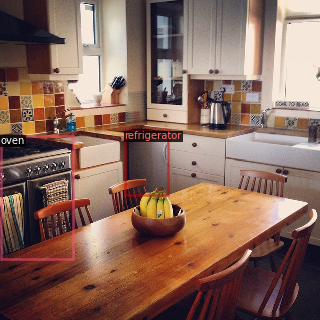

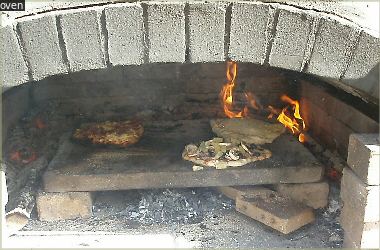

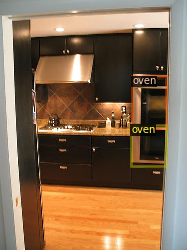

In [14]:
import random
for d in random.sample(dataset_val, 3):
    img = cv2.imread(d["file_name"])
    visualizer = Visualizer(img[:, :, ::-1], metadata=dataset_val_metadata, scale=0.5)
    out = visualizer.draw_dataset_dict(d)
    cv2_imshow(out.get_image()[:, :, ::-1])

In [15]:
from detectron2.engine import DefaultTrainer

cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file("COCO-Detection/faster_rcnn_R_50_FPN_1x.yaml"))
cfg.DATASETS.TRAIN = ("dataset_train",)
cfg.DATASETS.TEST = ("dataset_val",)
cfg.DATALOADER.NUM_WORKERS = 2
cfg.TEST.EVAL_PERIOD = 10
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-Detection/faster_rcnn_R_50_FPN_1x.yaml")  # Let training initialize from model zoo
cfg.SOLVER.IMS_PER_BATCH = 2  # This is the real "batch size" commonly known to deep learning people
cfg.SOLVER.BASE_LR = 0.00025  # pick a good LR
cfg.SOLVER.MAX_ITER = 300    # 300 iterations seems good enough for this toy dataset; you will need to train longer for a practical dataset
cfg.SOLVER.STEPS = []        # do not decay learning rate
cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 128   # The "RoIHead batch size". 128 is faster, and good enough for this toy dataset (default: 512)
cfg.MODEL.ROI_HEADS.NUM_CLASSES = len(amenities)  # only has one class (ballon). (see https://detectron2.readthedocs.io/tutorials/datasets.html#update-the-config-for-new-datasets)
# NOTE: this config means the number of classes, but a few popular unofficial tutorials incorrect uses num_classes+1 here.

os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)
trainer = DefaultTrainer(cfg) 
trainer.resume_or_load(resume=False)


[07/31 16:55:58 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res

model_final_b275ba.pkl: 167MB [00:05, 29.4MB/s]                           
Skip loading parameter 'roi_heads.box_predictor.cls_score.weight' to the model due to incompatible shapes: (81, 1024) in the checkpoint but (4, 1024) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.cls_score.bias' to the model due to incompatible shapes: (81,) in the checkpoint but (4,) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.bbox_pred.weight' to the model due to incompatible shapes: (320, 1024) in the checkpoint but (12, 1024) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.bbox_pred.bias' to the model due to incompatible shapes: (320,) in the checkpoint but (12,) in the model! You might want to double check if this is expected.
Some model parameters or buffers are not found in the checkpoint:
roi_heads.box_p

In [16]:
trainer.train()

[07/31 16:56:18 d2.engine.train_loop]: Starting training from iteration 0


/usr/local/lib/python3.7/dist-packages/torch/functional.py:478: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at  ../aten/src/ATen/native/TensorShape.cpp:2894.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


WARNING [07/31 16:56:30 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[07/31 16:56:30 d2.data.datasets.coco]: Loaded 275 images in COCO format from data/val/val.json
[07/31 16:56:30 d2.data.build]: Distribution of instances among all 3 categories:
|  category  | #instances   |  category  | #instances   |   category   | #instances   |
|:----------:|:-------------|:----------:|:-------------|:------------:|:-------------|
| microwave  | 108          |    oven    | 175          | refrigerator | 149          |
|            |              |            |              |              |              |
|   total    | 432          |            |              |              |              |
[07/31 16:56:30 d2.data.dataset_mapper]: [DatasetMapper] Augmentations used in inference: [ResizeShortestEdge(short_edge_length=(800, 800), max_size=1333, sample_style='choice')]
[07/31 16:56:30 d2.data.common]: Serializing 275 elements to byte

In [17]:
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.7   # set the testing threshold for this model
cfg.DATASETS.TEST = ("dataset_val", )
predictor = DefaultPredictor(cfg)

[07/31 16:58:47 d2.checkpoint.c2_model_loading]: Following weights matched with model:
| Names in Model                                  | Names in Checkpoint                                                                                  | Shapes                                          |
|:------------------------------------------------|:-----------------------------------------------------------------------------------------------------|:------------------------------------------------|
| backbone.bottom_up.res2.0.conv1.*               | backbone.bottom_up.res2.0.conv1.{norm.bias,norm.running_mean,norm.running_var,norm.weight,weight}    | (64,) (64,) (64,) (64,) (64,64,1,1)             |
| backbone.bottom_up.res2.0.conv2.*               | backbone.bottom_up.res2.0.conv2.{norm.bias,norm.running_mean,norm.running_var,norm.weight,weight}    | (64,) (64,) (64,) (64,) (64,64,3,3)             |
| backbone.bottom_up.res2.0.conv3.*               | backbone.bottom_up.res2.0.conv3.{norm.bia

In [33]:
from detectron2.engine.hooks import HookBase
from detectron2.evaluation import inference_context
from detectron2.utils.logger import log_every_n_seconds
from detectron2.data import DatasetMapper, build_detection_test_loader
import detectron2.utils.comm as comm
import torch
import time
import datetime

class LossEvalHook(HookBase):
    def __init__(self, eval_period, model, data_loader):
        self._model = model
        self._period = eval_period
        self._data_loader = data_loader
    
    def _do_loss_eval(self):
        # Copying inference_on_dataset from evaluator.py
        total = len(self._data_loader)
        num_warmup = min(5, total - 1)
            
        start_time = time.perf_counter()
        total_compute_time = 0
        losses = []
        for idx, inputs in enumerate(self._data_loader):            
            if idx == num_warmup:
                start_time = time.perf_counter()
                total_compute_time = 0
            start_compute_time = time.perf_counter()
            if torch.cuda.is_available():
                torch.cuda.synchronize()
            total_compute_time += time.perf_counter() - start_compute_time
            iters_after_start = idx + 1 - num_warmup * int(idx >= num_warmup)
            seconds_per_img = total_compute_time / iters_after_start
            if idx >= num_warmup * 2 or seconds_per_img > 5:
                total_seconds_per_img = (time.perf_counter() - start_time) / iters_after_start
                eta = datetime.timedelta(seconds=int(total_seconds_per_img * (total - idx - 1)))
                log_every_n_seconds(
                    logging.INFO,
                    "Loss on Validation  done {}/{}. {:.4f} s / img. ETA={}".format(
                        idx + 1, total, seconds_per_img, str(eta)
                    ),
                    n=5,
                )
            loss_batch = self._get_loss(inputs)
            losses.append(loss_batch)
        mean_loss = np.mean(losses)
        self.trainer.storage.put_scalar('validation_loss', mean_loss)
        comm.synchronize()

        return losses
            
    def _get_loss(self, data):
        # How loss is calculated on train_loop 
        metrics_dict = self._model(data)
        metrics_dict = {
            k: v.detach().cpu().item() if isinstance(v, torch.Tensor) else float(v)
            for k, v in metrics_dict.items()
        }
        total_losses_reduced = sum(loss for loss in metrics_dict.values())
        return total_losses_reduced
        
        
    def after_step(self):
        next_iter = self.trainer.iter + 1
        is_final = next_iter == self.trainer.max_iter
        if is_final or (self._period > 0 and next_iter % self._period == 0):
            self._do_loss_eval()
        self.trainer.storage.put_scalars(timetest=12)

In [34]:
class MyTrainer(DefaultTrainer):
    @classmethod
    def build_evaluator(cls, cfg, dataset_name, output_folder=None):
        if output_folder is None:
            output_folder = os.path.join(cfg.OUTPUT_DIR, "inference")
        return COCOEvaluator(dataset_name, cfg, True, output_folder)
                     
    def build_hooks(self):
        hooks = super().build_hooks()
        hooks.insert(-1,LossEvalHook(
            cfg.TEST.EVAL_PERIOD,
            self.model,
            build_detection_test_loader(
                self.cfg,
                self.cfg.DATASETS.TEST[0],
                DatasetMapper(self.cfg,True)
            )
        ))
        return hooks

In [35]:
cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file("COCO-Detection/faster_rcnn_R_50_FPN_1x.yaml"))
cfg.DATASETS.TRAIN = ("dataset_train",)
cfg.DATASETS.TEST = ("dataset_val",)
cfg.DATALOADER.NUM_WORKERS = 2
cfg.TEST.EVAL_PERIOD = 10
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-Detection/faster_rcnn_R_50_FPN_1x.yaml")  # Let training initialize from model zoo
cfg.SOLVER.IMS_PER_BATCH = 2  # This is the real "batch size" commonly known to deep learning people
cfg.SOLVER.BASE_LR = 0.00025  # pick a good LR
cfg.SOLVER.MAX_ITER = 300    # 300 iterations seems good enough for this toy dataset; you will need to train longer for a practical dataset
cfg.SOLVER.STEPS = []        # do not decay learning rate
cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 128   # The "RoIHead batch size". 128 is faster, and good enough for this toy dataset (default: 512)
cfg.MODEL.ROI_HEADS.NUM_CLASSES = len(amenities)  # only has one class (ballon). (see https://detectron2.readthedocs.io/tutorials/datasets.html#update-the-config-for-new-datasets)
# NOTE: this config means the number of classes, but a few popular unofficial tutorials incorrect uses num_classes+1 here.

os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)
trainer = MyTrainer(cfg) 
trainer.resume_or_load(resume=False)


[07/31 17:11:29 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res

Skip loading parameter 'roi_heads.box_predictor.cls_score.weight' to the model due to incompatible shapes: (81, 1024) in the checkpoint but (4, 1024) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.cls_score.bias' to the model due to incompatible shapes: (81,) in the checkpoint but (4,) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.bbox_pred.weight' to the model due to incompatible shapes: (320, 1024) in the checkpoint but (12, 1024) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.bbox_pred.bias' to the model due to incompatible shapes: (320,) in the checkpoint but (12,) in the model! You might want to double check if this is expected.
Some model parameters or buffers are not found in the checkpoint:
roi_heads.box_predictor.bbox_pred.{bias, weight}
roi_heads.box_predictor.cls_score.{bias, 

In [20]:
from detectron2.evaluation import COCOEvaluator, inference_on_dataset
from detectron2.data import build_detection_test_loader
evaluator = COCOEvaluator("dataset_val", cfg, False, output_dir="./output/")
val_loader = build_detection_test_loader(cfg, "dataset_val")
inference_on_dataset(trainer.model, val_loader, evaluator)

WARNING [07/31 16:58:47 d2.evaluation.coco_evaluation]: COCO Evaluator instantiated using config, this is deprecated behavior. Please pass in explicit arguments instead.
WARNING [07/31 16:58:47 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[07/31 16:58:47 d2.data.datasets.coco]: Loaded 275 images in COCO format from data/val/val.json
[07/31 16:58:47 d2.data.dataset_mapper]: [DatasetMapper] Augmentations used in inference: [ResizeShortestEdge(short_edge_length=(800, 800), max_size=1333, sample_style='choice')]
[07/31 16:58:47 d2.data.common]: Serializing 275 elements to byte tensors and concatenating them all ...
[07/31 16:58:47 d2.data.common]: Serialized dataset takes 0.08 MiB
[07/31 16:58:47 d2.evaluation.evaluator]: Start inference on 275 batches
[07/31 16:58:50 d2.evaluation.evaluator]: Inference done 11/275. Dataloading: 0.0200 s/iter. Inference: 0.1017 s/iter. Eval: 0.0003 s/iter. Total: 0.1221 s/iter. ETA=0:00:3

OrderedDict([('bbox',
              {'AP': 27.670623967370883,
               'AP-microwave': 28.646890230464678,
               'AP-oven': 15.988974235783465,
               'AP-refrigerator': 38.376007435864516,
               'AP50': 54.572607710030766,
               'AP75': 24.235513044448922,
               'APl': 32.48174768057244,
               'APm': 21.39950655638011,
               'APs': 24.47433523840189})])

In [21]:
import requests
import numpy as np
from io import BytesIO
from PIL import Image
from time import perf_counter


def test(url:str):
    img = Image.open(BytesIO(requests.get(url).content))
    im = cv2.cvtColor(np.array(img), cv2.COLOR_RGB2BGR)
    start = perf_counter()
    outputs = predictor(im)
    end = perf_counter()
    print(f'Inference time: {end-start} seconds \n')
    v = Visualizer(im[:, :, ::-1],
                   metadata=dataset_val_metadata, 
                   scale=0.5,
                  #  instance_mode=ColorMode.IMAGE   
    )
    v = v.draw_instance_predictions(outputs["instances"].to("cpu"))
    cv2_imshow(v.get_image()[:, :, ::-1])


Inference time: 0.19521596000004138 seconds 



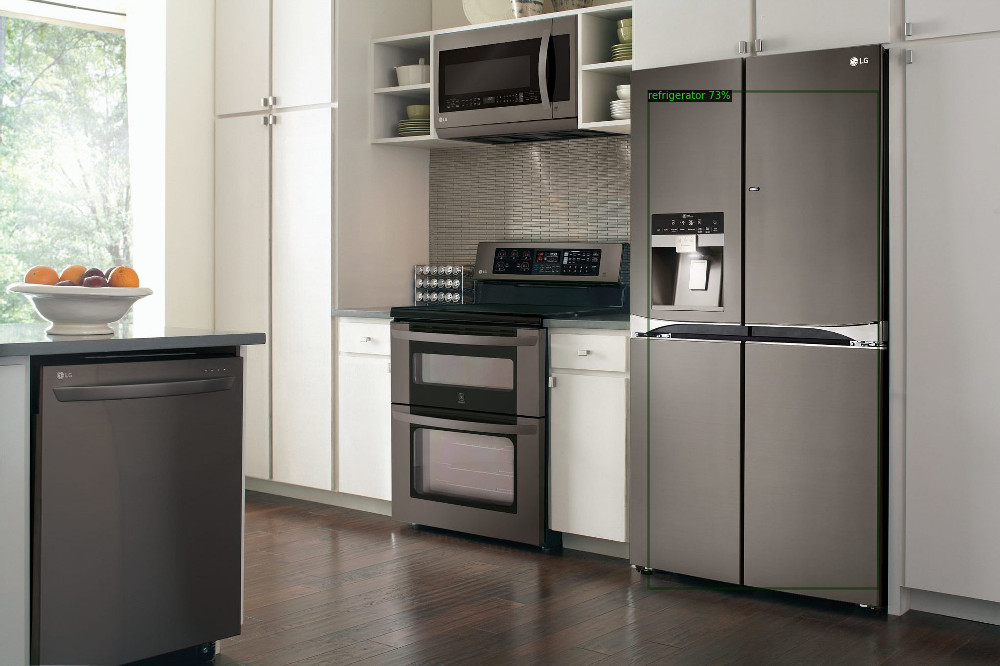

In [31]:
test("https://mlvtgiqzoszz.i.optimole.com/Sb3K8mU-bgP-D6bQ/w:2000/h:1333/q:90/https://www.appliancecity.co.uk/wp-content/uploads/2016/08/LG-Black-Stainless-Steel-Series-Lifestyle-Image-1.jpg")

Inference time: 0.1351836880000974 seconds 



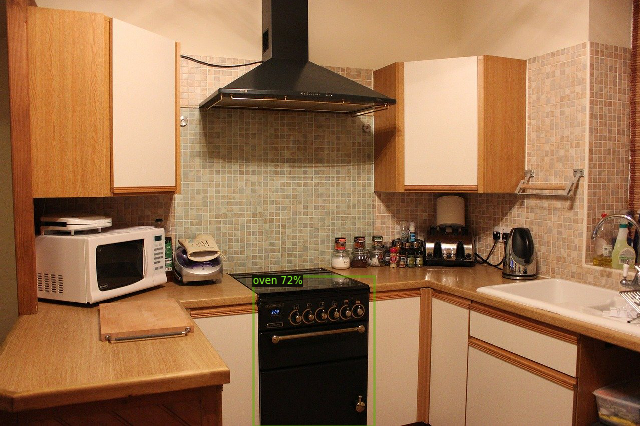

In [23]:
test('https://mishry.com/wp-content/uploads/2020/04/cooker-82993_1280-1.jpg')

Inference time: 0.12313008699993588 seconds 



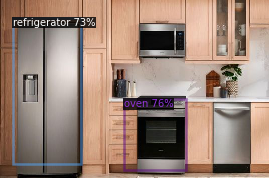

In [24]:
test('https://reviews.com.np/uploads/article/top-5-refrigerators-under-50000-in-nepal/thumb/540X360resize_top-5-refrigerators-under-50000-in-nepal.jpg')

In [25]:
%load_ext tensorboard
%tensorboard --logdir output

<IPython.core.display.Javascript object>

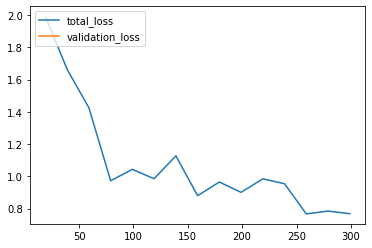

In [32]:

experiment_folder = './output/'

def load_json_arr(json_path):
    lines = []
    with open(json_path, 'r') as f:
        for line in f:
            lines.append(json.loads(line))
    return lines

experiment_metrics = load_json_arr(experiment_folder + '/metrics.json')

plt.plot(
    [x['iteration'] for x in experiment_metrics], 
    [x['total_loss'] for x in experiment_metrics])
plt.plot(
    [x['iteration'] for x in experiment_metrics if 'validation_loss' in x], 
    [x['validation_loss'] for x in experiment_metrics if 'validation_loss' in x])
plt.legend(['total_loss', 'validation_loss'], loc='upper left')
plt.show()